In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df=pd.read_csv(r"D:\Data Science\Project\fake_bills.csv", sep=';')
df

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
0,True,171.81,104.86,104.95,4.52,2.89,112.83
1,True,171.46,103.36,103.66,3.77,2.99,113.09
2,True,172.69,104.48,103.50,4.40,2.94,113.16
3,True,171.36,103.91,103.94,3.62,3.01,113.51
4,True,171.73,104.28,103.46,4.04,3.48,112.54
...,...,...,...,...,...,...,...
1495,False,171.75,104.38,104.17,4.42,3.09,111.28
1496,False,172.19,104.63,104.44,5.27,3.37,110.97
1497,False,171.80,104.01,104.12,5.51,3.36,111.95
1498,False,172.06,104.28,104.06,5.17,3.46,112.25


**EDA**

In [3]:
df.describe()

,diagonal,height_left,height_right,margin_low,margin_up,length
count,1500.000000,1500.000000,1500.000000,1463.000000,1500.000000,1500.00000
mean,171.958440,104.029533,103.920307,4.485967,3.151473,112.67850
std,0.305195,0.299462,0.325627,0.663813,0.231813,0.87273
min,171.040000,103.140000,102.820000,2.980000,2.270000,109.49000
25%,171.750000,103.820000,103.710000,4.015000,2.990000,112.03000
50%,171.960000,104.040000,103.920000,4.310000,3.140000,112.96000
75%,172.170000,104.230000,104.150000,4.870000,3.310000,113.34000
max,173.010000,104.880000,104.950000,6.900000,3.910000,114.44000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   bool   
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_low    1463 non-null   float64
 5   margin_up     1500 non-null   float64
 6   length        1500 non-null   float64
dtypes: bool(1), float64(6)
memory usage: 71.9 KB


In [5]:
df.isna().sum()

is_genuine       0
diagonal         0
height_left      0
height_right     0
margin_low      37
margin_up        0
length           0
dtype: int64

In [6]:
x = df[['is_genuine', 'diagonal', 'height_left', 'height_right',
       'margin_up', 'length','margin_low']]
x

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,True,171.81,104.86,104.95,2.89,112.83,4.52
1,True,171.46,103.36,103.66,2.99,113.09,3.77
2,True,172.69,104.48,103.50,2.94,113.16,4.40
3,True,171.36,103.91,103.94,3.01,113.51,3.62
4,True,171.73,104.28,103.46,3.48,112.54,4.04
...,...,...,...,...,...,...,...
1495,False,171.75,104.38,104.17,3.09,111.28,4.42
1496,False,172.19,104.63,104.44,3.37,110.97,5.27
1497,False,171.80,104.01,104.12,3.36,111.95,5.51
1498,False,172.06,104.28,104.06,3.46,112.25,5.17


In [7]:
x=x.dropna()

In [8]:
len(x)

1463

In [9]:
y=df[df.margin_low.isnull()]

In [10]:
len(y)

37

In [11]:
y.columns

Index(['is_genuine', 'diagonal', 'height_left', 'height_right', 'margin_low',
       'margin_up', 'length'],
      dtype='object')

In [12]:
y= y[['is_genuine', 'diagonal', 'height_left', 'height_right',
       'margin_up', 'length']]
y

,is_genuine,diagonal,height_left,height_right,margin_up,length
72,True,171.94,103.89,103.45,3.25,112.79
99,True,171.93,104.07,104.18,3.14,113.08
151,True,172.07,103.80,104.38,3.02,112.93
197,True,171.45,103.66,103.80,3.62,113.27
241,True,171.83,104.14,104.06,3.02,112.36
251,True,171.80,103.26,102.82,2.95,113.22
284,True,171.92,103.83,103.76,3.23,113.29
334,True,171.85,103.70,103.96,3.00,113.36
410,True,172.56,103.72,103.51,3.12,112.95
413,True,172.30,103.66,103.50,3.16,112.95


In [13]:
from sklearn.linear_model import LinearRegression

In [14]:
lg = LinearRegression()

In [15]:
x.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,True,171.81,104.86,104.95,2.89,112.83,4.52
1,True,171.46,103.36,103.66,2.99,113.09,3.77
2,True,172.69,104.48,103.50,2.94,113.16,4.40
3,True,171.36,103.91,103.94,3.01,113.51,3.62
4,True,171.73,104.28,103.46,3.48,112.54,4.04


In [16]:
a=x.iloc[:,:-1]
b=x['margin_low']

In [17]:
lg.fit(a,b)
ypred=lg.predict(y)

In [18]:
ypred

array([4.06495361, 4.11199026, 4.13400328, 3.99357074, 4.1403993 ,
       4.09428392, 4.07412432, 4.12538999, 4.0807278 , 4.07363322,
       4.11897255, 4.18037978, 4.13648423, 4.05106842, 4.17837685,
       4.22555104, 4.11586845, 4.10284101, 4.08184346, 4.09276238,
       4.11250192, 4.15717623, 4.16028787, 4.12193808, 4.12353555,
       4.19842271, 4.10962313, 4.09696025, 4.13384101, 5.25968515,
       5.264817  , 5.28251853, 5.30206887, 5.20035843, 5.1754678 ,
       5.17345045, 5.24675055])

In [19]:
y['margin_low']=ypred

In [20]:
y

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
72,True,171.94,103.89,103.45,3.25,112.79,4.064954
99,True,171.93,104.07,104.18,3.14,113.08,4.111990
151,True,172.07,103.80,104.38,3.02,112.93,4.134003
197,True,171.45,103.66,103.80,3.62,113.27,3.993571
241,True,171.83,104.14,104.06,3.02,112.36,4.140399
251,True,171.80,103.26,102.82,2.95,113.22,4.094284
284,True,171.92,103.83,103.76,3.23,113.29,4.074124
334,True,171.85,103.70,103.96,3.00,113.36,4.125390
410,True,172.56,103.72,103.51,3.12,112.95,4.080728
413,True,172.30,103.66,103.50,3.16,112.95,4.073633


In [21]:
x.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,True,171.81,104.86,104.95,2.89,112.83,4.52
1,True,171.46,103.36,103.66,2.99,113.09,3.77
2,True,172.69,104.48,103.50,2.94,113.16,4.40
3,True,171.36,103.91,103.94,3.01,113.51,3.62
4,True,171.73,104.28,103.46,3.48,112.54,4.04


In [22]:
y.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
72,True,171.94,103.89,103.45,3.25,112.79,4.064954
99,True,171.93,104.07,104.18,3.14,113.08,4.111990
151,True,172.07,103.80,104.38,3.02,112.93,4.134003
197,True,171.45,103.66,103.80,3.62,113.27,3.993571
241,True,171.83,104.14,104.06,3.02,112.36,4.140399


In [23]:
df4=pd.concat([x,y], axis=0)

In [24]:
df4.head()

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,True,171.81,104.86,104.95,2.89,112.83,4.52
1,True,171.46,103.36,103.66,2.99,113.09,3.77
2,True,172.69,104.48,103.50,2.94,113.16,4.40
3,True,171.36,103.91,103.94,3.01,113.51,3.62
4,True,171.73,104.28,103.46,3.48,112.54,4.04


In [25]:
df4.isna().sum()

is_genuine      0
diagonal        0
height_left     0
height_right    0
margin_up       0
length          0
margin_low      0
dtype: int64

In [26]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500 entries, 0 to 1438
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   is_genuine    1500 non-null   bool   
 1   diagonal      1500 non-null   float64
 2   height_left   1500 non-null   float64
 3   height_right  1500 non-null   float64
 4   margin_up     1500 non-null   float64
 5   length        1500 non-null   float64
 6   margin_low    1500 non-null   float64
dtypes: bool(1), float64(6)
memory usage: 83.5 KB


In [27]:
df4['is_genuine']=df4['is_genuine'].replace({True:1})
df4['is_genuine']=df4['is_genuine'].replace({False:0})
df4

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,1,171.81,104.86,104.95,2.89,112.83,4.520000
1,1,171.46,103.36,103.66,2.99,113.09,3.770000
2,1,172.69,104.48,103.50,2.94,113.16,4.400000
3,1,171.36,103.91,103.94,3.01,113.51,3.620000
4,1,171.73,104.28,103.46,3.48,112.54,4.040000
...,...,...,...,...,...,...,...
1303,0,172.17,104.49,103.76,2.93,111.21,5.302069
1315,0,172.08,104.15,104.17,3.40,112.29,5.200358
1347,0,171.72,104.46,104.12,3.61,110.31,5.175468
1435,0,172.66,104.33,104.41,3.56,111.47,5.173450


In [28]:
df4.reset_index(drop=True)

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,1,171.81,104.86,104.95,2.89,112.83,4.520000
1,1,171.46,103.36,103.66,2.99,113.09,3.770000
2,1,172.69,104.48,103.50,2.94,113.16,4.400000
3,1,171.36,103.91,103.94,3.01,113.51,3.620000
4,1,171.73,104.28,103.46,3.48,112.54,4.040000
...,...,...,...,...,...,...,...
1495,0,172.17,104.49,103.76,2.93,111.21,5.302069
1496,0,172.08,104.15,104.17,3.40,112.29,5.200358
1497,0,171.72,104.46,104.12,3.61,110.31,5.175468
1498,0,172.66,104.33,104.41,3.56,111.47,5.173450


In [29]:
df.corr()

,is_genuine,diagonal,height_left,height_right,margin_low,margin_up,length
is_genuine,1.000000,0.132756,-0.379833,-0.485092,-0.783032,-0.606262,0.849285
diagonal,0.132756,1.000000,0.019472,-0.024492,-0.111534,-0.055649,0.097587
height_left,-0.379833,0.019472,1.000000,0.242279,0.302643,0.246522,-0.320863
height_right,-0.485092,-0.024492,0.242279,1.000000,0.391085,0.307005,-0.401751
margin_low,-0.783032,-0.111534,0.302643,0.391085,1.000000,0.431606,-0.666753
margin_up,-0.606262,-0.055649,0.246522,0.307005,0.431606,1.000000,-0.520575
length,0.849285,0.097587,-0.320863,-0.401751,-0.666753,-0.520575,1.000000


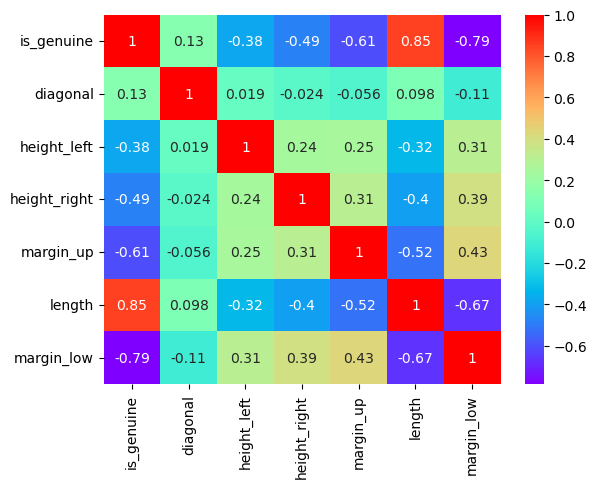

In [30]:
sns.heatmap(df4.corr(),cmap='rainbow',annot=True)
plt.show()

In [31]:
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250 

sns.set_style('darkgrid')

<AxesSubplot:xlabel='is_genuine', ylabel='count'>

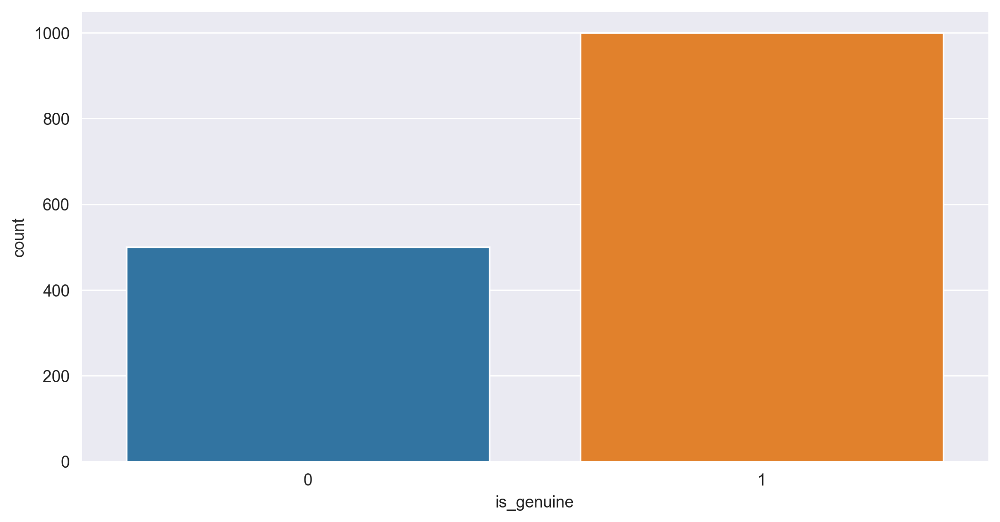

In [32]:
sns.countplot(data=df4,x='is_genuine')

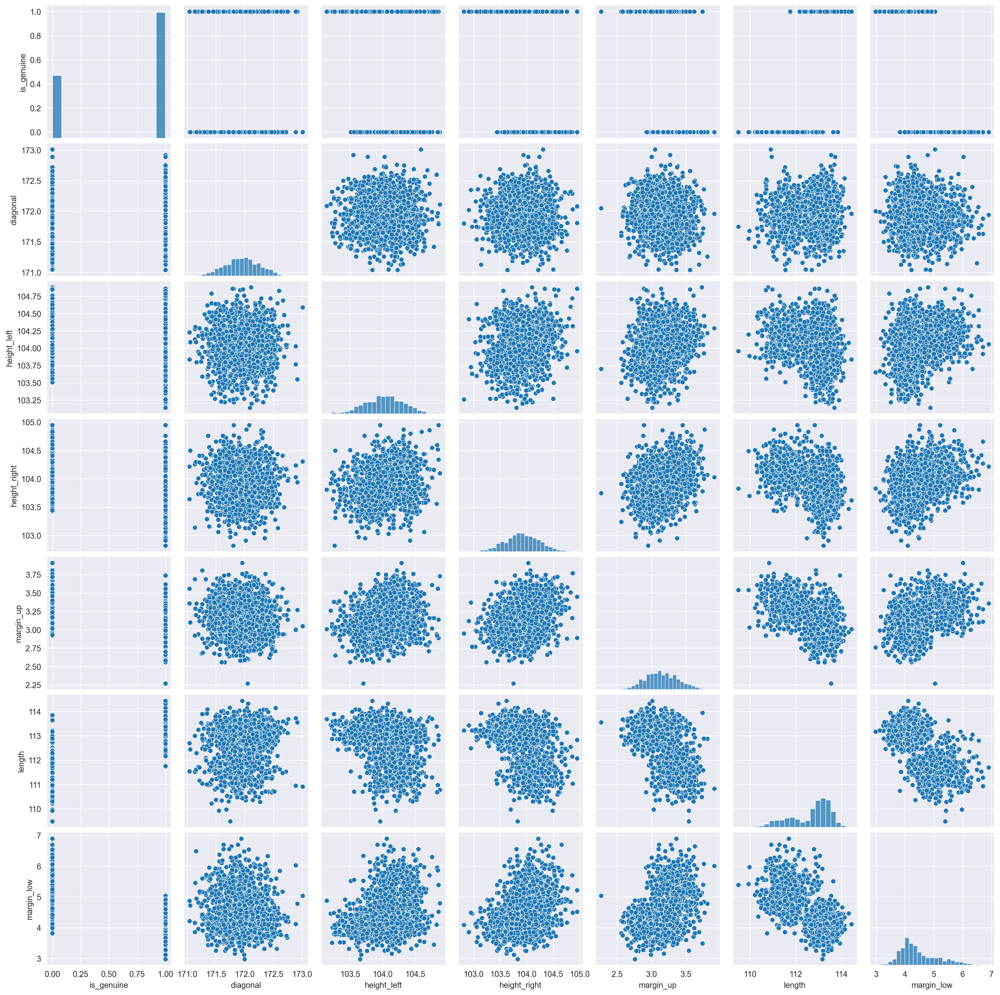

In [33]:
sns.pairplot(data=df4)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
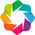

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [34]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

In [35]:
report = AV.AutoViz(filename='', sep ='' , depVar ='', dfte = df4, header = 0,
verbose = 0, lowess = False, chart_format ='svg', max_rows_analyzed = 150000, max_cols_analyzed = 30)

Shape of your Data Set loaded: (1500, 7)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  6
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    7 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 21
All Plots done
Time to run AutoViz = 2 seconds 

 ############

In [36]:
df4=df4.reset_index(drop=True)

In [37]:
df4

,is_genuine,diagonal,height_left,height_right,margin_up,length,margin_low
0,1,171.81,104.86,104.95,2.89,112.83,4.520000
1,1,171.46,103.36,103.66,2.99,113.09,3.770000
2,1,172.69,104.48,103.50,2.94,113.16,4.400000
3,1,171.36,103.91,103.94,3.01,113.51,3.620000
4,1,171.73,104.28,103.46,3.48,112.54,4.040000
...,...,...,...,...,...,...,...
1495,0,172.17,104.49,103.76,2.93,111.21,5.302069
1496,0,172.08,104.15,104.17,3.40,112.29,5.200358
1497,0,171.72,104.46,104.12,3.61,110.31,5.175468
1498,0,172.66,104.33,104.41,3.56,111.47,5.173450


In [38]:
df4.columns

Index(['is_genuine', 'diagonal', 'height_left', 'height_right', 'margin_up',
       'length', 'margin_low'],
      dtype='object')

In [39]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250

In [40]:
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression()

In [41]:
x = df4.iloc[:,1:]
y = df4['is_genuine']

In [42]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,train_size=0.75,random_state=1, stratify=df4['is_genuine'])

In [43]:
y.unique()

array([1, 0], dtype=int64)

In [44]:
lg.fit(xtrain,ytrain)
ypred = lg.predict(xtest)
ypred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,

In [45]:
sc = StandardScaler()
x = sc.fit_transform(xtest)
x

array([[ 1.00780698,  0.8667656 ,  0.89622797,  1.70207381,  0.89334103,
        -0.8802291 ],
       [ 0.84503343, -1.01587993, -0.41125541,  0.341702  ,  0.16107003,
        -0.17478104],
       [-1.0756944 , -0.5204469 ,  2.26597246,  0.5611168 , -0.01645021,
        -0.56959143],
       ...,
       [ 1.33335407,  0.76767899, -0.19334151, -0.09712762,  0.13888   ,
        -0.00967618],
       [-1.20591323, -0.32227368,  0.05570294,  1.04382938, -1.09266668,
         1.16106741],
       [-0.16416255,  1.03190994, -0.50464708, -0.84313797, -0.03864024,
        -0.03969524]])

In [46]:
km = KMeans()
y = km.fit_predict(x)
y

array([5, 1, 4, 1, 7, 5, 6, 7, 1, 0, 4, 0, 7, 3, 6, 6, 2, 7, 2, 5, 7, 0,
       3, 6, 5, 4, 0, 2, 0, 6, 0, 0, 7, 7, 1, 3, 3, 5, 0, 4, 5, 4, 1, 4,
       0, 6, 1, 0, 3, 5, 7, 1, 7, 7, 3, 6, 4, 7, 5, 1, 6, 2, 2, 5, 5, 1,
       6, 1, 1, 3, 4, 6, 7, 7, 4, 7, 5, 7, 7, 5, 0, 7, 6, 2, 6, 1, 6, 6,
       2, 4, 2, 6, 7, 2, 0, 3, 7, 0, 4, 0, 6, 6, 1, 5, 3, 7, 0, 5, 5, 3,
       6, 5, 0, 7, 5, 2, 6, 5, 4, 4, 7, 7, 0, 4, 0, 4, 3, 1, 4, 0, 7, 7,
       4, 4, 1, 0, 2, 6, 6, 3, 2, 7, 7, 1, 2, 0, 3, 2, 7, 4, 6, 0, 6, 2,
       3, 3, 6, 5, 4, 7, 0, 3, 7, 5, 2, 4, 1, 6, 7, 0, 4, 6, 5, 6, 6, 3,
       0, 3, 3, 7, 0, 5, 2, 1, 1, 2, 6, 3, 7, 1, 4, 3, 1, 6, 5, 2, 5, 3,
       7, 5, 2, 6, 4, 7, 0, 7, 6, 7, 0, 5, 5, 1, 2, 6, 4, 0, 1, 7, 4, 6,
       0, 2, 5, 1, 0, 4, 2, 7, 1, 7, 6, 2, 5, 4, 5, 2, 1, 0, 5, 6, 7, 6,
       5, 5, 0, 6, 5, 5, 1, 7, 1, 7, 1, 6, 2, 2, 5, 1, 4, 3, 1, 3, 1, 0,
       2, 5, 7, 3, 5, 4, 3, 7, 0, 3, 5, 5, 4, 5, 5, 4, 5, 3, 4, 0, 5, 2,
       1, 0, 7, 3, 6, 1, 7, 6, 7, 1, 7, 5, 4, 3, 5,

In [47]:
d1 = pd.DataFrame(x, columns=xtest.columns)
d1['cluster'] = y
d1

,diagonal,height_left,height_right,margin_up,length,margin_low,cluster
0,1.007807,0.866766,0.896228,1.702074,0.893341,-0.880229,5
1,0.845033,-1.015880,-0.411255,0.341702,0.161070,-0.174781,1
2,-1.075694,-0.520447,2.265972,0.561117,-0.016450,-0.569591,4
3,0.617150,-1.313140,-0.006558,-0.448191,0.738011,-0.219810,1
4,-1.173359,-1.577371,-0.598039,-1.238085,0.138880,-1.030324,7
...,...,...,...,...,...,...,...
370,-1.629124,-0.652562,0.055703,0.034521,0.993196,-0.399924,7
371,0.128830,-0.619534,-0.660300,-1.194202,1.270572,0.440610,6
372,1.333354,0.767679,-0.193342,-0.097128,0.138880,-0.009676,5
373,-1.205913,-0.322274,0.055703,1.043829,-1.092667,1.161067,0


In [48]:
km.cluster_centers_

array([[-0.628421  ,  0.540067  , -0.07355654,  0.49910827, -1.1995165 ,
         0.98576048],
       [ 0.6440081 , -1.32882846, -0.50386881,  0.08498667,  0.60459326,
        -0.44530057],
       [-1.13537803,  0.67226226, -0.27289738, -0.15929515,  0.54754639,
        -0.56036185],
       [ 0.70305873,  0.09792693,  0.63680667,  1.11818662, -1.48777249,
         1.1556473 ],
       [-0.49340903,  0.8427446 ,  1.56624245,  0.97800494, -0.96910855,
         1.28069885],
       [ 1.13140452,  0.44634728,  0.24301392, -0.30241063,  0.62480406,
        -0.63498127],
       [ 0.35610993,  0.03309248, -1.1485884 , -0.63591287,  0.70862958,
        -0.58291963],
       [-0.75937114, -1.07698334, -0.1798516 , -0.86215392,  0.53922513,
        -0.60620717]])

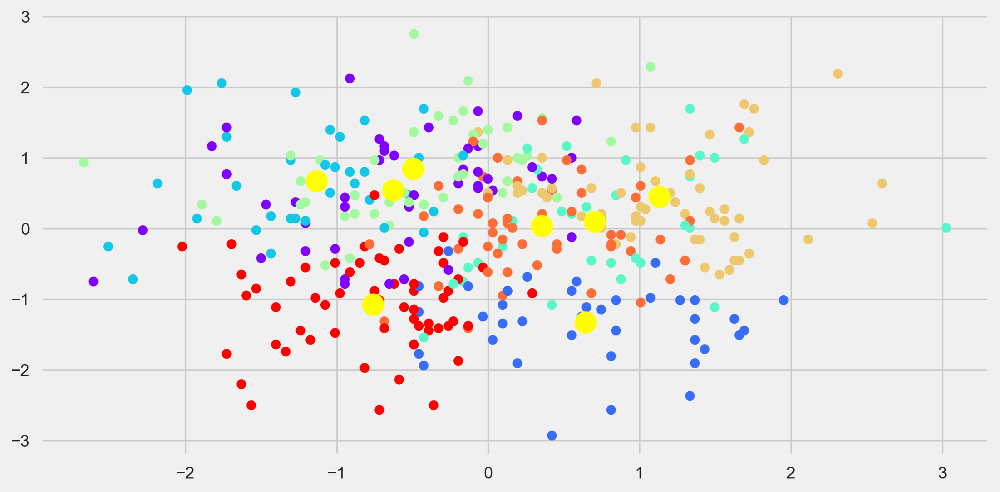

In [49]:
plt.scatter(d1.iloc[:,0],d1.iloc[:,1], c = d1['cluster'], cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1], c = 'yellow', s = 200)

In [50]:
wcss = []

for i in range(1,21):
    km = KMeans(n_clusters=i)
    km.fit_predict(x)
    wcss.append(km.inertia_)

In [51]:
wcss

[2250.0,
 1442.0044258910723,
 1247.9104175114978,
 1141.1578723514815,
 1059.748183704125,
 1000.1584740168746,
 945.0465963692951,
 896.694066314745,
 855.1083193244458,
 815.3087341126999,
 786.0572968677961,
 754.9089624012425,
 730.7722967786274,
 698.2458199283293,
 689.0568974841392,
 673.3201569340127,
 652.4282016956014,
 637.1128646889729,
 619.2113218714793,
 611.0472670186142]

Text(0, 0.5, 'WCSS')

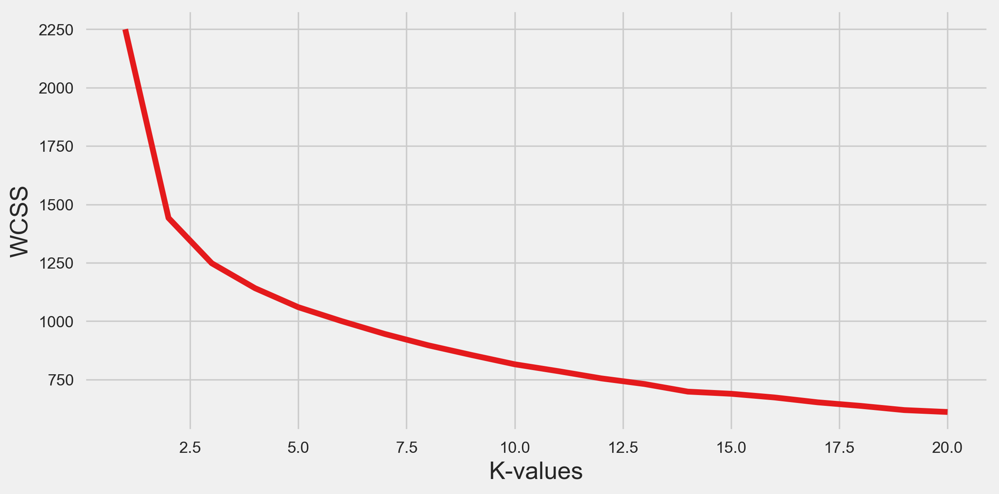

In [52]:
plt.plot(range(1,21), wcss)
plt.xlabel('K-values')
plt.ylabel('WCSS')

In [53]:
km = KMeans(n_clusters=2)
y = km.fit_predict(x)
y= np.where((y==0)|(y==1), y^1, y)
y

array([1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1,

In [54]:
from sklearn.metrics import confusion_matrix,classification_report
print(classification_report(ypred,y))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       126
           1       0.99      0.99      0.99       249

    accuracy                           0.99       375
   macro avg       0.99      0.98      0.99       375
weighted avg       0.99      0.99      0.99       375



In [55]:
print(classification_report(ytest,y))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       125
           1       0.99      0.99      0.99       250

    accuracy                           0.98       375
   macro avg       0.98      0.98      0.98       375
weighted avg       0.98      0.98      0.98       375

